# Analysis of surface fields in SOGOS area

- variance at small scale
- surface spectra
- surface densities
- seasonal changes in above properties
- movies of surface fields


In [1]:
# Setup cluster
from dask.distributed import Client, progress
from dask_kubernetes import KubeCluster
cluster = KubeCluster()
cluster.adapt(minimum=1, maximum=20)
client = Client(cluster)
client

distributed.scheduler - INFO - Clear task state
/srv/conda/envs/notebook/lib/python3.7/site-packages/distributed/dashboard/core.py:72: UserWarning: 
Port 8787 is already in use. 
Perhaps you already have a cluster running?
Hosting the diagnostics dashboard on a random port instead.
  warnings.warn("\n" + msg)
distributed.scheduler - INFO -   Scheduler at:   tcp://10.32.16.29:35579
distributed.scheduler - INFO -   dashboard at:                    :37211
distributed.scheduler - INFO - Receive client connection: Client-85f57ab6-90b4-11ea-8483-02629f7bdac6
distributed.core - INFO - Starting established connection


Client Scheduler: tcp://10.32.16.29:35579 Dashboard: /user/0000-0001-6632-0187/proxy/37211/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [2]:
# Load some useful modules 
import numpy as np
import xarray as xr
import xrft
import intake
from xmitgcm import llcreader
from matplotlib import pyplot as plt

%matplotlib inline

/srv/conda/envs/notebook/lib/python3.7/site-packages/intake/source/discovery.py:136: FutureWarning: The drivers ['geojson', 'postgis', 'shapefile', 'spatialite'] do not specify entry_points and were only discovered via a package scan. This may break in a future release of intake. The packages should be updated.
  FutureWarning)


In [5]:
cat_url = "https://raw.githubusercontent.com/pangeo-data/pangeo-datastore/master/intake-catalogs/ocean/llc4320.yaml"
cat = intake.Catalog(cat_url)

In [6]:
# Get variables from catalog
sst = cat.LLC4320_SST.to_dask()
sss = cat.LLC4320_SSS.to_dask()
ssh = cat.LLC4320_SSH.to_dask()
u = cat.LLC4320_SSU.to_dask()
v = cat.LLC4320_SSV.to_dask()

In [7]:
ds = xr.merge([ssh, sst, sss, u, v])
ds = llcreader.llcmodel.faces_dataset_to_latlon(ds, metric_vector_pairs=[])
ds

,Array,Chunk
Bytes,8.09 TB,74.65 MB
Shape,"(9030, 12960, 17280)","(1, 4320, 4320)"
Count,659191 Tasks,108360 Chunks
Type,float32,numpy.ndarray


In [8]:
coords = cat.LLC4320_grid.to_dask().reset_coords()
coords = llcreader.llcmodel.faces_dataset_to_latlon(coords)

In [96]:
coords

<xarray.Dataset>
Dimensions:  (face: 13, i: 17280, i_g: 17280, j: 12960, j_g: 12960, k_p1: 2, time: 9030)
Coordinates:
  * i_g      (i_g) int64 0 1 2 3 4 5 6 ... 17274 17275 17276 17277 17278 17279
  * i        (i) int64 0 1 2 3 4 5 6 ... 17274 17275 17276 17277 17278 17279
  * k_p1     (k_p1) int64 0 1
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j_g      (j_g) int64 0 1 2 3 4 5 6 ... 12954 12955 12956 12957 12958 12959
  * j        (j) int64 0 1 2 3 4 5 6 ... 12954 12955 12956 12957 12958 12959
  * time     (time) datetime64[ns] 2011-09-13 ... 2012-09-23T05:00:00
Data variables:
    CS       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    Depth    (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    PHrefC   float32 15.4017
    PHrefF   (k_p1) float32 dask.array<chunksize=(2,), meta=np.ndarray>
    SN       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    XC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    XG       (j_g, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    YC       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    YG       (j_g, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    Z        float32 -1.57
    Zl       float32 -1.0
    Zp1      (k_p1) float32 dask.array<chunksize=(2,), meta=np.ndarray>
    Zu       float32 -2.14
    drC      (k_p1) float32 dask.array<chunksize=(2,), meta=np.ndarray>
    drF      float32 1.14
    hFacC    (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    hFacS    (j_g, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    hFacW    (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    iter     (time) int64 dask.array<chunksize=(9030,), meta=np.ndarray>
    k        int64 1
    k_l      int64 1
    k_u      int64 1
    rA       (j, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    rAs      (j_g, i) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    rAw      (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    rAz      (j_g, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    dxC      (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    dyC      (j_g, i) float32 dask.array<chunksize=(1, 4320), meta=np.ndarray>
    dyG      (j, i_g) float32 dask.array<chunksize=(4320, 4320), meta=np.ndarray>
    dxG      (j_g, i) float32 dask.array<chunksize=(1, 4320), meta=np.ndarray>

In [11]:
import xgcm
grid = xgcm.Grid(coords.drop(['k', 'k_p1']), periodic=None)
grid

<xgcm.Grid>
T Axis (not periodic):
  * center   time
Y Axis (not periodic):
  * center   j --> left
  * left     j_g --> center
X Axis (not periodic):
  * center   i --> left
  * left     i_g --> center

### Select Area

SOGOS area   
Lat ~ -55 -> -48  
Lon ~ 28 -> 40

In [14]:
sel_sogos = np.logical_and(np.logical_and(coords.XC>28, coords.XC<40 ), np.logical_and(coords.YC>-56, coords.YC<-48 ))
sel_sogos_G = np.logical_and(np.logical_and(coords.XG>28, coords.XG<40 ), np.logical_and(coords.YG>-56, coords.YG<-48 ))

In [15]:
XC = coords.XC.where(sel_sogos, drop=True)
YC = coords.YC.where(sel_sogos, drop=True)
XCmean = XC.mean(['j'])
YCmean = YC.mean(['i'])

Xmax = XC.max(['j'])
Xmin = XC.min(['j'])
Ymax = YC.max(['i'])
Ymin = YC.min(['i'])

distributed.scheduler - INFO - Retire worker names (5,)
distributed.deploy.adaptive - INFO - Retiring workers [5]
distributed.scheduler - INFO - Remove worker tcp://10.32.39.9:34987
distributed.core - INFO - Removing comms to tcp://10.32.39.9:34987
distributed.scheduler - INFO - Lost all workers
distributed.scheduler - INFO - Register tcp://10.32.84.9:36279
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.84.9:36279
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (6,)
distributed.deploy.adaptive - INFO - Retiring workers [6]
distributed.scheduler - INFO - Remove worker tcp://10.32.84.9:36279
distributed.core - INFO - Removing comms to tcp://10.32.84.9:36279
distributed.scheduler - INFO - Lost all workers
distributed.scheduler - INFO - Register tcp://10.32.10.9:35195
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.10.9:35195
distributed.core - INFO - Starting established con

ValueError: dimensions {'j_g', 'i_g'} do not exist. Expected one or more of ('j', 'i')

distributed.scheduler - INFO - Retire worker names (11, 12)
distributed.deploy.adaptive - INFO - Retiring workers [11, 12]
distributed.scheduler - INFO - Remove worker tcp://10.32.15.8:46783
distributed.core - INFO - Removing comms to tcp://10.32.15.8:46783
distributed.scheduler - INFO - Remove worker tcp://10.32.55.9:39449
distributed.core - INFO - Removing comms to tcp://10.32.55.9:39449
distributed.scheduler - INFO - Remove worker tcp://10.32.31.13:40833
distributed.core - INFO - Removing comms to tcp://10.32.31.13:40833


In [17]:
XG = coords.XG.where(sel_sogos_G, drop=True)
YG = coords.YG.where(sel_sogos_G, drop=True)
XGmean = XG.mean(['j_g'])
YGmean = YG.mean(['i_g'])

distributed.scheduler - INFO - Retire worker names (16,)
distributed.deploy.adaptive - INFO - Retiring workers [16]
distributed.scheduler - INFO - Register tcp://10.32.31.14:41701
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.31.14:41701
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.39.14:39873
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.39.14:39873
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (17,)
distributed.deploy.adaptive - INFO - Retiring workers [17]
distributed.scheduler - INFO - Remove worker tcp://10.32.31.14:41701
distributed.core - INFO - Removing comms to tcp://10.32.31.14:41701
distributed.scheduler - INFO - Register tcp://10.32.10.10:32923
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.10.10:32923
distributed.core - INFO - Starting established connection
dist

In [12]:
# Error due to crudely ignoring that the grid is non-uniform in km.
print(((Xmean-Xmin)*110).max().values)
print(((Ymean-Ymin)*110).max().values)

0.018463135
0.0008392334


In [18]:
SSH_sogos = ds.Eta.where(sel_sogos, drop=True)
SST_sogos = ds.SST.where(sel_sogos, drop=True)
SSS_sogos = ds.SSS.where(sel_sogos, drop=True)

distributed.scheduler - INFO - Retire worker names (17,)
distributed.deploy.adaptive - INFO - Retiring workers [17]
distributed.scheduler - INFO - Register tcp://10.32.10.11:32845
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.10.11:32845
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Remove worker tcp://10.32.39.14:39873
distributed.core - INFO - Removing comms to tcp://10.32.39.14:39873
distributed.scheduler - INFO - Register tcp://10.32.31.15:33995
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.31.15:33995
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (18,)
distributed.deploy.adaptive - INFO - Retiring workers [18]
distributed.scheduler - INFO - Remove worker tcp://10.32.10.11:32845
distributed.core - INFO - Removing comms to tcp://10.32.10.11:32845
distributed.scheduler - INFO - Retire worker names (19,)
distributed.deploy.

### Seasonal Evolution of temperature, salinity, and height

In [63]:
SST_monthly= SST_sogos.isel(i=slice(0,100), j=slice(0,100)).resample(time='M').mean(['time','i','j'])
SSS_monthly= SSS_sogos.isel(i=slice(0,100), j=slice(0,100)).resample(time='M').mean(['time','i','j'])
SSH_monthly= SSH_sogos.isel(i=slice(0,100), j=slice(0,100)).resample(time='M').mean(['time','i','j'])

In [64]:
SST_monthly.load()

distributed.core - INFO - Event loop was unresponsive in Scheduler for 7.84s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.core - INFO - Event loop was unresponsive in Scheduler for 8.06s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
distributed.scheduler - INFO - Register tcp://10.32.56.13:44911
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.56.13:44911
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.30.4:38655
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.30.4:38655
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.20.4:33709
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.20.4:33709
distributed.c

<xarray.DataArray 'SST' (time: 13)>
array([1.0952041 , 0.72713274, 1.2390712 , 1.7524264 , 2.3573613 ,
       2.7108176 , 2.932078  , 3.036066  , 2.2677898 , 1.9444703 ,
       1.4272962 , 0.8231209 , 0.48467883], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2011-09-30 2011-10-31 ... 2012-09-30

In [65]:
SSS_monthly.load()
SSH_monthly.load()

distributed.scheduler - INFO - Retire worker names (71, 72, 73, 74, 75, 76, 77, 78, 79)
distributed.deploy.adaptive - INFO - Retiring workers [71, 72, 73, 74, 75, 76, 77, 78, 79]
distributed.scheduler - INFO - Remove worker tcp://10.32.14.11:42263
distributed.core - INFO - Removing comms to tcp://10.32.14.11:42263
distributed.scheduler - INFO - Remove worker tcp://10.32.84.18:43137
distributed.core - INFO - Removing comms to tcp://10.32.84.18:43137
distributed.scheduler - INFO - Remove worker tcp://10.32.23.8:33321
distributed.core - INFO - Removing comms to tcp://10.32.23.8:33321
distributed.scheduler - INFO - Remove worker tcp://10.32.48.11:41385
distributed.core - INFO - Removing comms to tcp://10.32.48.11:41385
distributed.scheduler - INFO - Remove worker tcp://10.32.39.21:40183
distributed.core - INFO - Removing comms to tcp://10.32.39.21:40183
distributed.scheduler - INFO - Remove worker tcp://10.32.17.5:42621
distributed.core - INFO - Removing comms to tcp://10.32.17.5:42621
dis

<xarray.DataArray 'Eta' (time: 13)>
array([-0.9728625 , -1.1920242 , -1.0604252 , -1.0865858 , -1.0188497 ,
       -1.0911261 , -0.9587266 , -0.7977404 , -0.8893212 , -0.7777312 ,
       -0.86195016, -0.9503796 , -1.0150851 ], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2011-09-30 2011-10-31 ... 2012-09-30

distributed.scheduler - INFO - Retire worker names (128, 109, 110, 111, 112)
distributed.deploy.adaptive - INFO - Retiring workers [128, 109, 110, 111, 112]
distributed.scheduler - INFO - Remove worker tcp://10.32.17.8:45999
distributed.core - INFO - Removing comms to tcp://10.32.17.8:45999
distributed.scheduler - INFO - Remove worker tcp://10.32.39.25:37899
distributed.core - INFO - Removing comms to tcp://10.32.39.25:37899
distributed.scheduler - INFO - Remove worker tcp://10.32.84.20:33965
distributed.core - INFO - Removing comms to tcp://10.32.84.20:33965
distributed.scheduler - INFO - Remove worker tcp://10.32.55.17:36251
distributed.core - INFO - Removing comms to tcp://10.32.55.17:36251
distributed.scheduler - INFO - Remove worker tcp://10.32.14.12:32783
distributed.core - INFO - Removing comms to tcp://10.32.14.12:32783
distributed.scheduler - INFO - Retire worker names (113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124)
distributed.deploy.adaptive - INFO - Retiring wo

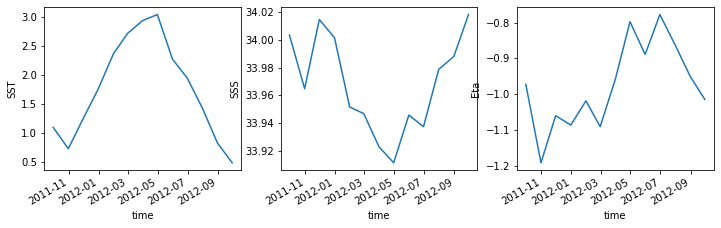

In [67]:
plt.figure(figsize=(12,3))
plt.subplot(131)
SST_monthly.plot()

plt.subplot(132)
SSS_monthly.plot()

plt.subplot(133)
SSH_monthly.plot()


In [68]:
import gsw

In [69]:
SSD_monthly = gsw.sigma0(SSS_monthly, SST_monthly)

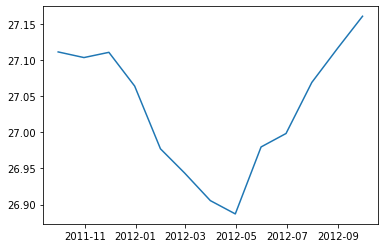

In [72]:
plt.plot(SST_monthly.time, SSD_monthly)

### Vorticity Evolution

In [19]:
zeta = (-grid.diff(ds.U * coords.dxC, 'Y', boundary='extend')
        +grid.diff(ds.V * coords.dyC, 'X', boundary='extend'))/coords.rAz

In [20]:
zeta_sogos = zeta.where(sel_sogos_G, drop=True)

distributed.scheduler - INFO - Retire worker names (19,)
distributed.deploy.adaptive - INFO - Retiring workers [19]
distributed.scheduler - INFO - Register tcp://10.32.10.12:41339
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.10.12:41339
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (20,)
distributed.deploy.adaptive - INFO - Retiring workers [20]
distributed.scheduler - INFO - Remove worker tcp://10.32.10.12:41339
distributed.core - INFO - Removing comms to tcp://10.32.10.12:41339


In [21]:
zeta_sogos

,Array,Chunk
Bytes,13.71 GB,1.52 MB
Shape,"(9030, 660, 575)","(1, 660, 575)"
Count,9157099 Tasks,9030 Chunks
Type,float32,numpy.ndarray


In [29]:
# f=2*omega*sin(theta)
f = 2*(2*np.pi/24/3600)*np.sin(-55*np.pi/360)
f

-6.715861347891006e-05

In [32]:
bins = np.linspace(-2, 4, 20)

94.04166666666667

In [49]:
time1=slice(0*2257,1*2257,24*7)
time2=slice(1*2257,2*2257,24*7)
time3=slice(2*2257,3*2257,24*7)
time4=slice(3*2257,4*2257,24*7)

In [38]:
vort_hist1 = np.histogram(zeta_sogos.isel(time=time1)/f, bins=bins);

distributed.scheduler - INFO - Retire worker names (20, 15)
distributed.deploy.adaptive - INFO - Retiring workers [20, 15]
distributed.scheduler - INFO - Remove worker tcp://10.32.39.13:39241
distributed.core - INFO - Removing comms to tcp://10.32.39.13:39241
distributed.scheduler - INFO - Lost all workers
distributed.scheduler - INFO - Register tcp://10.32.10.13:32801
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.10.13:32801
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.55.10:37175
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.55.10:37175
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.31.17:42633
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.31.17:42633
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.14.9:33403
di

In [50]:
vort_hist2 = np.histogram(zeta_sogos.isel(time=time2)/f, bins=bins);
vort_hist3 = np.histogram(zeta_sogos.isel(time=time3)/f, bins=bins);
vort_hist4 = np.histogram(zeta_sogos.isel(time=time4)/f, bins=bins);

distributed.scheduler - INFO - Retire worker names (32, 33, 34, 35, 36)
distributed.deploy.adaptive - INFO - Retiring workers [32, 33, 34, 35, 36]
distributed.scheduler - INFO - Register tcp://10.32.31.18:46639
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.31.18:46639
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.14.10:39021
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.14.10:39021
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.15.9:39109
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.15.9:39109
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.39.16:38157
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.39.16:38157
distributed.core - INFO - Starting established connection
distributed.schedul

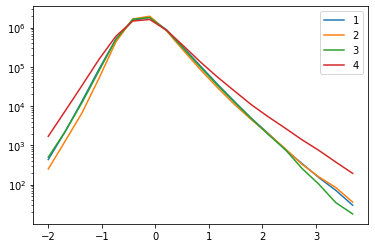

distributed.scheduler - INFO - Remove worker tcp://10.32.84.16:43041
distributed.core - INFO - Removing comms to tcp://10.32.84.16:43041


In [52]:
plt.plot(bins[0:-1], vort_hist1[0], label='1')
plt.plot(bins[0:-1], vort_hist2[0], label='2')
plt.plot(bins[0:-1], vort_hist3[0], label='3')
plt.plot(bins[0:-1], vort_hist4[0], label='4')
plt.yscale('log')
plt.legend()

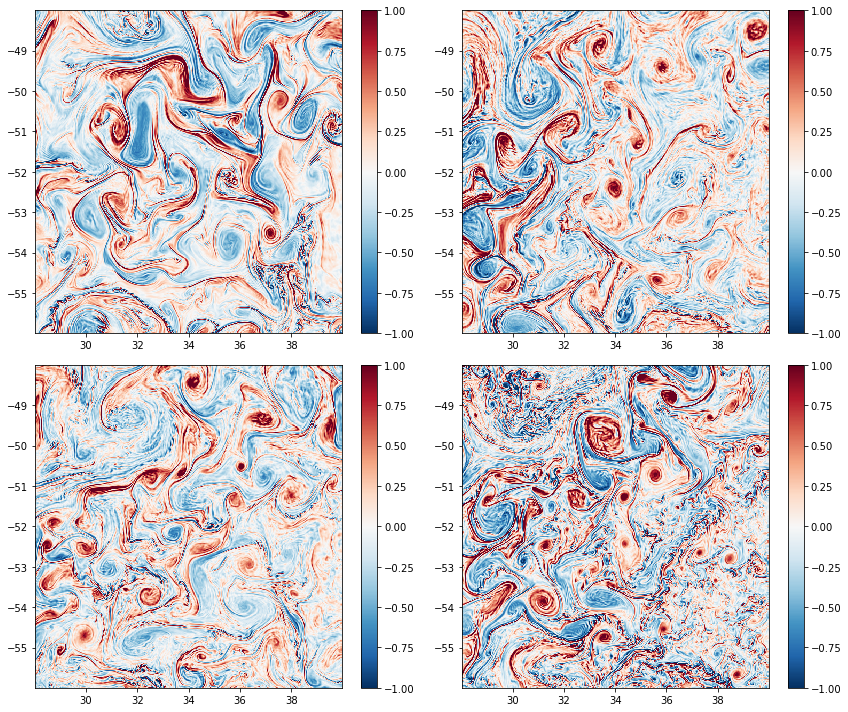

In [73]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XGmean, YGmean, 
               zeta_sogos.isel(time=0)/f, vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

plt.subplot(222)
plt.pcolormesh(XGmean, YGmean, 
               zeta_sogos.isel(time=2257)/f, vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

plt.subplot(223)
plt.pcolormesh(XGmean, YGmean, 
               zeta_sogos.isel(time=2257*2)/f, vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

plt.subplot(224)
plt.pcolormesh(XGmean, YGmean, 
               zeta_sogos.isel(time=2257*4)/f, vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

plt.tight_layout()

### Small Scale variability 

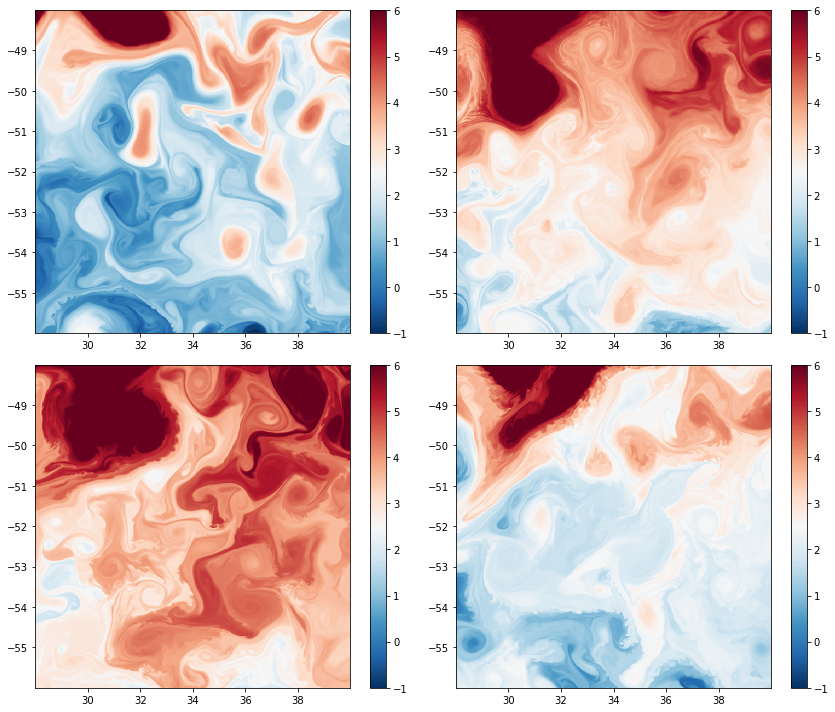

In [74]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos.isel(time=0), vmin=-1, vmax=6, cmap='RdBu_r')
plt.colorbar()

plt.subplot(222)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos.isel(time=2257), vmin=-1, vmax=6, cmap='RdBu_r')
plt.colorbar()

plt.subplot(223)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos.isel(time=2257*2), vmin=-1, vmax=6, cmap='RdBu_r')
plt.colorbar()

plt.subplot(224)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos.isel(time=2257*3), vmin=-1, vmax=6, cmap='RdBu_r')
plt.colorbar()

plt.tight_layout()

In [114]:
dX = XCmean.diff('i')
dY = YCmean.diff('j')

In [115]:
print((dX.mean()*110*np.cos(-55*np.pi/180)).values)
print((dY.mean()*110).values)

1.3144598
1.3335081


In [121]:
SST_sogos_coarse = (SST_sogos.rolling(i=40, center=True).mean()
                   ).rolling(j=40, center=True).mean()

distributed.core - INFO - Event loop was unresponsive in Scheduler for 7.16s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.


In [122]:
SST_sogos_anom = SST_sogos - SST_sogos_coarse

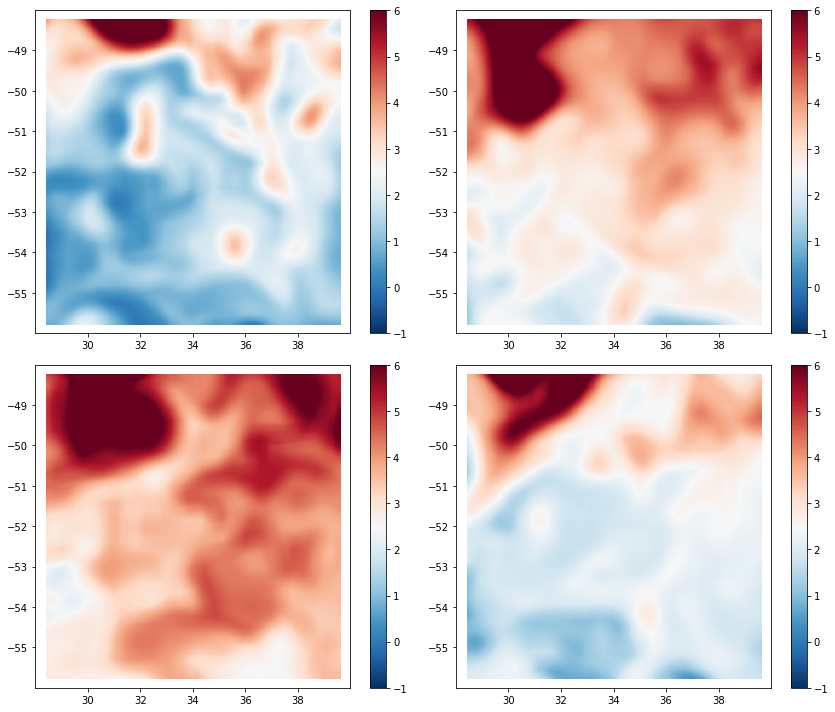

In [123]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos_coarse.isel(time=0), vmin=-1, vmax=6, cmap='RdBu_r')
plt.colorbar()

plt.subplot(222)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos_coarse.isel(time=2257), vmin=-1, vmax=6, cmap='RdBu_r')
plt.colorbar()

plt.subplot(223)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos_coarse.isel(time=2257*2), vmin=-1, vmax=6, cmap='RdBu_r')
plt.colorbar()

plt.subplot(224)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos_coarse.isel(time=2257*3), vmin=-1, vmax=6, cmap='RdBu_r')
plt.colorbar()

plt.tight_layout()

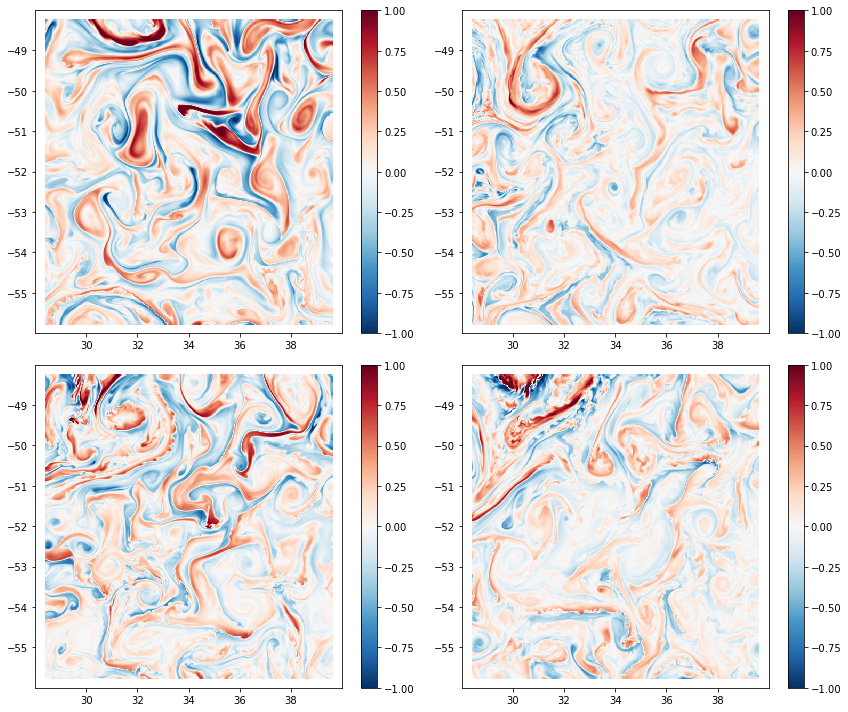

In [125]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos_anom.isel(time=0), vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

plt.subplot(222)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos_anom.isel(time=2257), vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

plt.subplot(223)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos_anom.isel(time=2257*2), vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

plt.subplot(224)
plt.pcolormesh(XCmean, YCmean, 
               SST_sogos_anom.isel(time=2257*3), vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

plt.tight_layout()

In [131]:
SST_sogos_anom

,Array,Chunk
Bytes,13.73 GB,1.52 MB
Shape,"(9030, 660, 576)","(1, 659, 575)"
Count,2709237 Tasks,36120 Chunks
Type,float32,numpy.ndarray


In [144]:
SST_small_scale_std_south = SST_sogos_anom.isel(time=slice(0,9030,24*7)
                                               ).isel(i=slice(0,200), j=slice(0,200)).std(['i','j'])
SST_small_scale_std_middle = SST_sogos_anom.isel(time=slice(0,9030,24*7)
                                               ).isel(i=slice(250,450), j=slice(250,450)).std(['i','j'])
SST_small_scale_std_north = SST_sogos_anom.isel(time=slice(0,9030,24*7)
                                               ).isel(i=slice(250,450), j=slice(450,650)).std(['i','j'])

In [150]:
SST_small_scale_std = SST_sogos_anom.isel(time=slice(0,9030,24*15)).std(['i','j'])



In [152]:
SST_small_scale_std.load()

distributed.scheduler - INFO - Retire worker names (209,)
distributed.deploy.adaptive - INFO - Retiring workers [209]
distributed.scheduler - INFO - Register tcp://10.32.48.22:40669
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.48.22:40669
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.15.22:38587
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.15.22:38587
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.77.23:33225
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.77.23:33225
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.84.27:42879
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.84.27:42879
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://

<xarray.DataArray (time: 26)>
array([0.30473205, 0.29540455, 0.26778147, 0.26527008, 0.23260522,
       0.21976377, 0.21500702, 0.22234274, 0.2185174 , 0.24739315,
       0.2815616 , 0.2766676 , 0.25376788, 0.23550169, 0.2631059 ,
       0.24010015, 0.2370948 , 0.2383061 , 0.22057298, 0.21918331,
       0.22800703, 0.23804499, 0.25582072, 0.25369933, 0.26304767,
       0.27550268], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2011-09-13 2011-09-28 ... 2012-09-22

distributed.scheduler - INFO - Register tcp://10.32.14.20:39383
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.14.20:39383
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Retire worker names (211, 212, 213, 214)
distributed.deploy.adaptive - INFO - Retiring workers [211, 212, 213, 214]
distributed.scheduler - INFO - Remove worker tcp://10.32.77.23:33225
distributed.core - INFO - Removing comms to tcp://10.32.77.23:33225
distributed.scheduler - INFO - Remove worker tcp://10.32.15.22:38587
distributed.core - INFO - Removing comms to tcp://10.32.15.22:38587
distributed.scheduler - INFO - Remove worker tcp://10.32.20.6:33031
distributed.core - INFO - Removing comms to tcp://10.32.20.6:33031
distributed.scheduler - INFO - Remove worker tcp://10.32.84.27:42879
distributed.core - INFO - Removing comms to tcp://10.32.84.27:42879
distributed.scheduler - INFO - Retire worker names (191,)
distributed.deploy.adaptive - INFO - Ret

In [145]:
SST_small_scale_std_north.load();
SST_small_scale_std_south.load();
SST_small_scale_std_middle.load();

distributed.scheduler - INFO - Retire worker names (169, 170, 167)
distributed.deploy.adaptive - INFO - Retiring workers [169, 170, 167]
distributed.scheduler - INFO - Remove worker tcp://10.32.31.28:39335
distributed.core - INFO - Removing comms to tcp://10.32.31.28:39335
distributed.scheduler - INFO - Lost all workers
distributed.scheduler - INFO - Register tcp://10.32.48.20:38815
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.48.20:38815
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.56.21:34421
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.56.21:34421
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32.23.15:46665
distributed.scheduler - INFO - Starting worker compute stream, tcp://10.32.23.15:46665
distributed.core - INFO - Starting established connection
distributed.scheduler - INFO - Register tcp://10.32

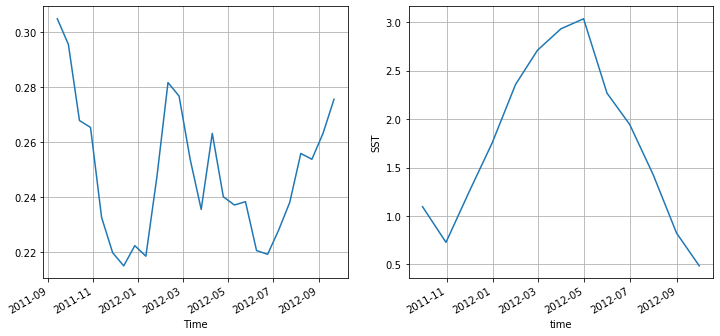

distributed.core - INFO - Event loop was unresponsive in Scheduler for 6.38s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.


In [155]:
plt.figure(figsize=(12,5))

plt.subplot(121)
#(SST_small_scale_std_south).plot()
#(SST_small_scale_std_middle).plot()
#(SST_small_scale_std_north).plot()
SST_small_scale_std.plot()
plt.grid()

plt.subplot(122)
SST_monthly.plot()
plt.grid()